<a href="https://colab.research.google.com/github/JudsonLima/computationalImaging/blob/master/HW6_JudsonLimaFinal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Computational Imaging HW 6

Judson Lima

OPTI 556, Fall 2023

## Libraries

In [50]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import cv2
from skimage import io
%matplotlib inline
plt.rcParams['figure.figsize'] = [20, 20]
plt.rcParams.update({'font.size': 22})
from google.colab import files
from scipy.special import jn, jn_zeros


import random
from joblib import Parallel, delayed
import time
from skimage import exposure, filters
from skimage.metrics import structural_similarity as ssim


The objective of this notebook is to display an understanding of bandlimiting in imaging systems, considering both specular and diffuse objects. Also to use Fourier phychography to reconstruct high resolution phase images of some objects through a low bandwidth channel.

# Bandlimiting in Imaging Systems

## Impulse response and transfer function

Starting with a model for an inpulse response of coherent focal imaging system as
\begin{equation}
   h(x'',y'',x_r,y_r)=|M|e^{2\pi i{(d_i+d_o)\over \lambda}}
e^{i\pi {{{x''}^2+{y''}^2}\over
    {\lambda d_i}}}
e^{i\pi {{{x_o}^2+{y_o}^2}\over
    {\lambda d_o}}}h_r(x''-x_r,y''-y_r)
 \end{equation}
where
\begin{equation}
 h_r(x,y)= {1\over \lambda^2 d_i^2}\int\int
P(x',y')e^{-i{2\pi\over \lambda d_i} \left (x'x +y'y\right
  )}dx'dy'
\end{equation}
and $P(x,y)$ is the pupil function. For a circular apeture,
$$P(x,y)= {\rm
  circ}(\sqrt{x^2+y^2}/A)$$
   and
 \begin{equation}
   h_r(x,y)=\frac{\pi}{2} {A^2\over \lambda^2 d_i^2}{\rm jinc}\left ({A\over
      \lambda d_i}\sqrt{x^2+y^2}\right )
 \end{equation}
 where ${\rm jinc}(x)=2 \frac{J_1(\pi x)}{\pi x}$

In [2]:
def jinc(x):
  # impulse response
  ji=2*jn(1,np.pi*(x+10**(-8)))/(np.pi*(x+10**(-8)))
  return ji
def pupil(x):
  p=1-np.heaviside(np.abs(x)-.5,0)
  return p


## plots of impulse response and bandpass

Text(0.5, 0, '1/$\\lambda$ f/#')

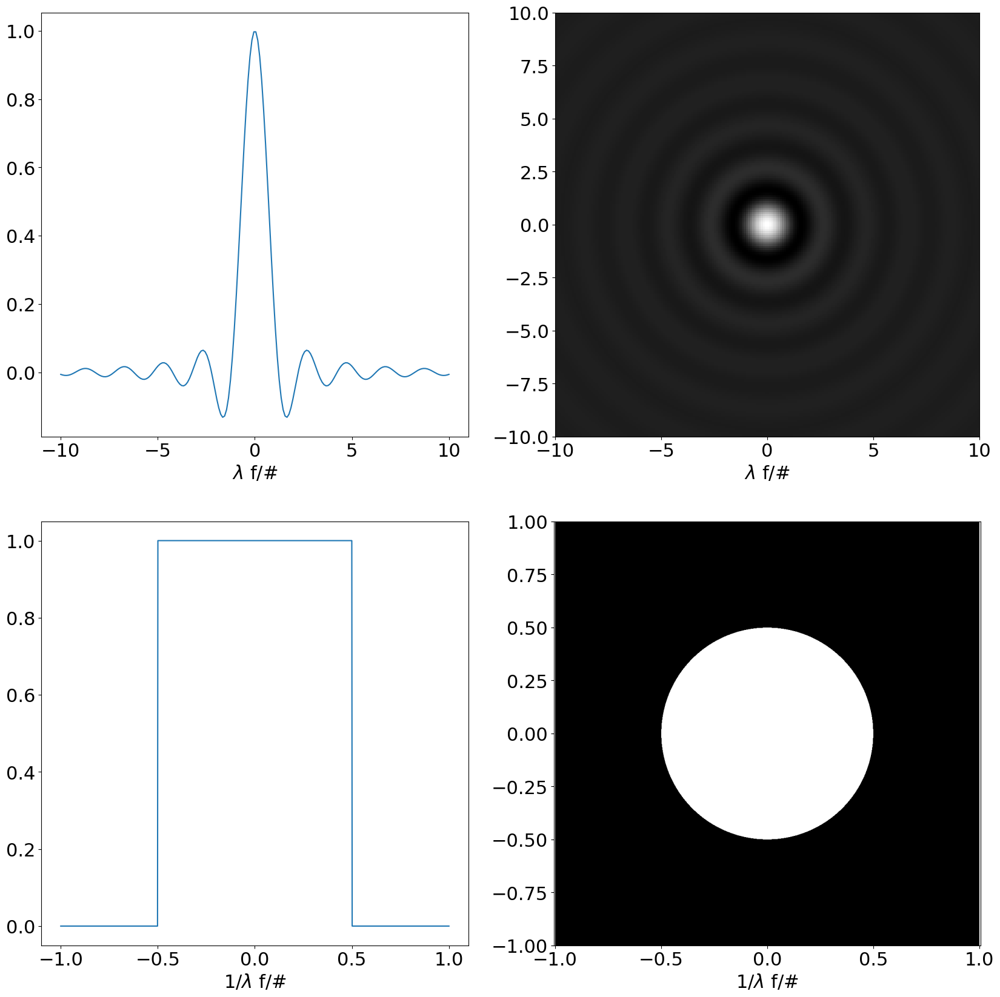

In [3]:
plt.rcParams['figure.figsize'] = [20, 20]
fig, ax = plt.subplots(2,2)
x=np.linspace(-10,10,200)
u=np.linspace(-2,2,200)
ax[0,0].plot(x,jinc(x))
ax[0,0].set_xlabel(r'$\lambda$ f/#')
X, Y=np.meshgrid(x,x)
ax[0,1].imshow(jinc(np.sqrt(X**2+Y**2)),cmap='gray', extent=[-10,10,-10,10])
ax[0,1].set_xlabel(r'$\lambda$ f/#')
# plot of the bandpass vs 1/lambda f/#
side = np.linspace(-1, 1, 1048)
ax[1,0].plot(side,pupil(side))
ax[1,0].set_xlabel(r'1/$\lambda$ f/#')
X, Y = np.meshgrid(side, side)
Z = pupil(np.sqrt(X**2+Y**2))
ax[1,1].imshow(Z, cmap='gray', extent=[-1,1,-1,1])
ax[1,1].axis('equal')
ax[1,1].set_xlabel(r'1/$\lambda$ f/#')

## Resolution Chart

Experimental image of a resolution chart illuminated by a collimated 532 nm laser. The transverse units are microns. The focal length is 25 mm with an f/4 aperture at a range of 500 mm. The cross section of the bright field is approximately 300 microns, corresponding to a 20x reduction in the 6.25 mm aperture.

In [83]:
!wget --no-check-certificate --content-disposition 'https://github.com/djbradyAtOpticalSciencesArizona/computationalImaging/raw/master/images/resolutionChart.npz'

--2023-11-22 04:40:45--  https://github.com/djbradyAtOpticalSciencesArizona/computationalImaging/raw/master/images/resolutionChart.npz
Resolving github.com (github.com)... 20.27.177.113
Connecting to github.com (github.com)|20.27.177.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/djbradyAtOpticalSciencesArizona/computationalImaging/master/images/resolutionChart.npz [following]
--2023-11-22 04:40:45--  https://raw.githubusercontent.com/djbradyAtOpticalSciencesArizona/computationalImaging/master/images/resolutionChart.npz
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 640970 (626K) [application/octet-stream]
Saving to: ‘resolutionChart.npz’

resolutionChart.npz 100%[===================>] 62

In [86]:
imL=np.load('resolutionChart.npz')
rC=imL['rC']
rCH=imL['rCH']
rE=imL['rE']
rEH=imL['rEH']

In [87]:
ex=200*1.85

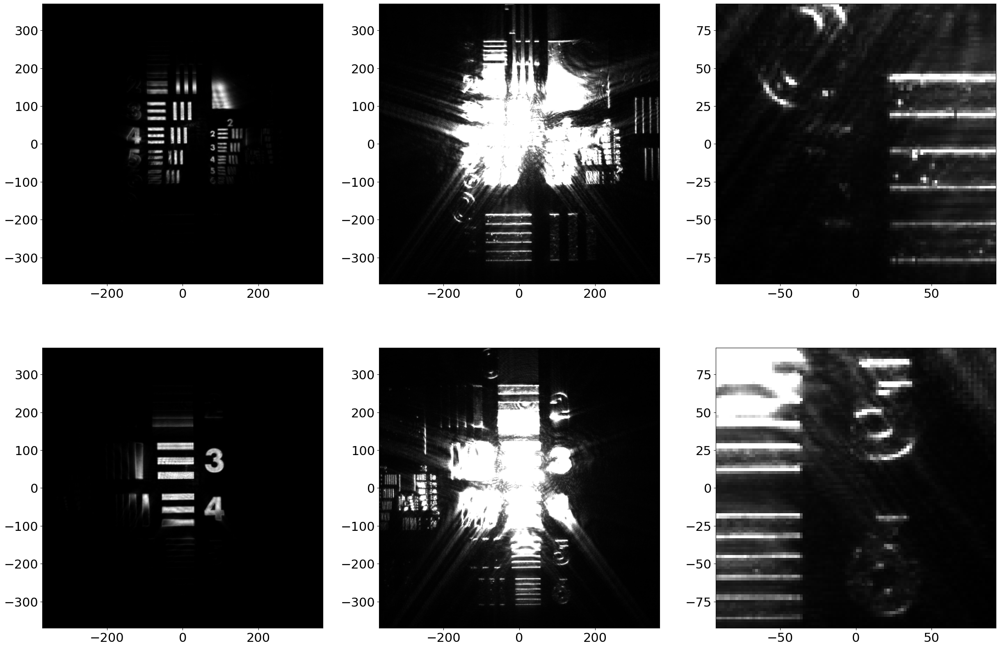

In [88]:
plt.figure(figsize=(30,20))
plt.subplot(2,3,1)
plt.imshow(rC,cmap='gray', extent=[-ex,ex,-ex,ex])
plt.subplot(2,3,2)
plt.imshow(rCH,cmap='gray', extent=[-ex,ex,-ex,ex])
plt.subplot(2,3,3)
plt.imshow(rCH[275:375,90:190],cmap='gray', extent=[-ex/4,ex/4,-ex/4,ex/4])
plt.subplot(2,3,4)
plt.imshow(rE,cmap='gray' ,extent=[-ex,ex,-ex,ex])
plt.subplot(2,3,5)
plt.imshow(rEH,cmap='gray' ,extent=[-ex,ex,-ex,ex])
plt.subplot(2,3,6)
plt.imshow(rEH[270:370,200:300],cmap='gray', extent=[-ex/4,ex/4,-ex/4,ex/4])


While features are observed beyond the limitations of the con- stant field, the high frequency features at the edge of the scene are aliased into the low frequency passband. The solid bars and numbers of the chart begin to experience high pass filtering at the edges of the aperture.

The center images show the same scene as the left images, but with the exposure time increased by 100x, such that the center saturates. With this exposure, one observes the high frequency components of the target outside the aperture.

The right images are details of the lower center of the middle images, illustrating the high pass filtering effect.

## Image transformations

Now assuming that the object ranges from -64 $\lambda$ f/# to 64 $\lambda$ f/# and the sampling period is $\frac{\lambda f/\#}{4}$. Writing the signal as
$$f(x)=\cos (2\pi \alpha x^2)$$
we set we set $\alpha= \frac{1}{128(\lambda f/\#)^2}$, which means that at the edge of the field, the spatial frequency is approximately $\frac{0.5}{\lambda f/\#}$

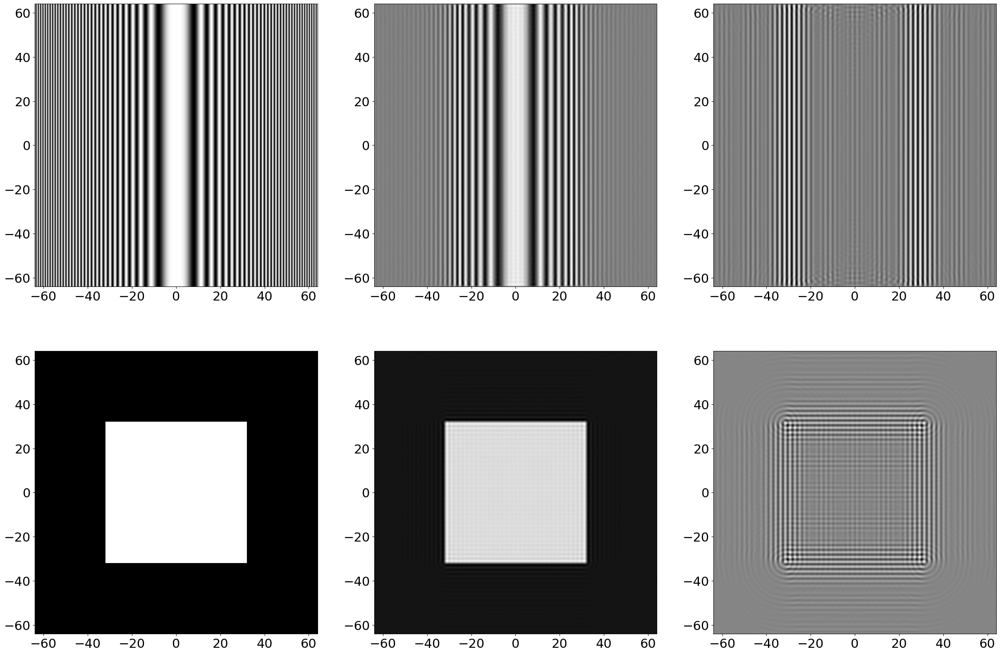

In [4]:
plt.rcParams['figure.figsize'] = [30, 20]
X=64
N=512
dx=2*X/(N-1)
B=1/(2*dx)
side = np.linspace(-X, X, N)
X, Y = np.meshgrid(side, side)
u = np.linspace(-B, B, 2*N)
U, V= np.meshgrid(u,u)
# true image
alpha=1./128.
Z = np.cos(2*np.pi*alpha*X**2)
fig, [[ax1, ax2, ax3], [ax4, ax5, ax6]] = plt.subplots(2,3)
ax1.imshow(Z, cmap='gray', extent=[-64,64,-64,64], aspect='equal')
# low pass filtered by cicular pupil
zz=np.zeros((2*N,2*N))
zz[np.int16(N/2):np.int16(3*N/2),np.int16(N/2):np.int16(3*N/2)]=Z
zzft=np.fft.fftshift(np.fft.fft2(zz))
zzftFiltered=zzft*pupil(np.sqrt(U**2+V**2))
zzFiltered=np.real(np.fft.ifft2(np.fft.ifftshift(zzftFiltered)))[np.int16(N/2):np.int16(3*N/2),np.int16(N/2):np.int16(3*N/2)]
ax2.imshow(zzFiltered, cmap='gray', extent=[-64,64,-64,64], aspect='equal')
# High pass filtered by annular pupil
zz=np.zeros((2*N,2*N))
zz[np.int16(N/2):np.int16(3*N/2),np.int16(N/2):np.int16(3*N/2)]=Z
zzft=np.fft.fftshift(np.fft.fft2(zz))
zzftFiltered=zzft*(pupil(np.sqrt(U**2+V**2))-pupil(1.2*np.sqrt(U**2+V**2)))
zzFiltered=np.real(np.fft.ifft2(np.fft.ifftshift(zzftFiltered)))[np.int16(N/2):np.int16(3*N/2),np.int16(N/2):np.int16(3*N/2)]
ax3.imshow(zzFiltered, cmap='gray', extent=[-64,64,-64,64], aspect='equal')
# different object
# true image
Z=np.zeros((N,N))
Z[np.int16(N/4):np.int16(3*N/4),np.int16(N/4):np.int16(3*N/4)]=1
ax4.imshow(Z, cmap='gray', extent=[-64,64,-64,64], aspect='equal')
# low pass filtered by cicular pupil
zz=np.zeros((2*N,2*N))
zz[np.int16(N/2):np.int16(3*N/2),np.int16(N/2):np.int16(3*N/2)]=Z
zzft=np.fft.fftshift(np.fft.fft2(zz))
zzftFiltered=zzft*pupil(np.sqrt(U**2+V**2))
zzFiltered=np.real(np.fft.ifft2(np.fft.ifftshift(zzftFiltered)))[np.int16(N/2):np.int16(3*N/2),np.int16(N/2):np.int16(3*N/2)]
ax5.imshow(zzFiltered, cmap='gray', extent=[-64,64,-64,64], aspect='equal')
# High pass filtered by annular pupil
zz=np.zeros((2*N,2*N))
zz[np.int16(N/2):np.int16(3*N/2),np.int16(N/2):np.int16(3*N/2)]=Z
zzft=np.fft.fftshift(np.fft.fft2(zz))
zzftFiltered=zzft*(pupil(np.sqrt(U**2+V**2))-pupil(1.2*np.sqrt(U**2+V**2)))
zzFiltered=np.real(np.fft.ifft2(np.fft.ifftshift(zzftFiltered)))[np.int16(N/2):np.int16(3*N/2),np.int16(N/2):np.int16(3*N/2)]
ax6.imshow(zzFiltered, cmap='gray', extent=[-64,64,-64,64], aspect='equal')

## Phase curvature on coherent image formation

Text(0.5, 0, '$mA=1024\\lambda f/\\#$')

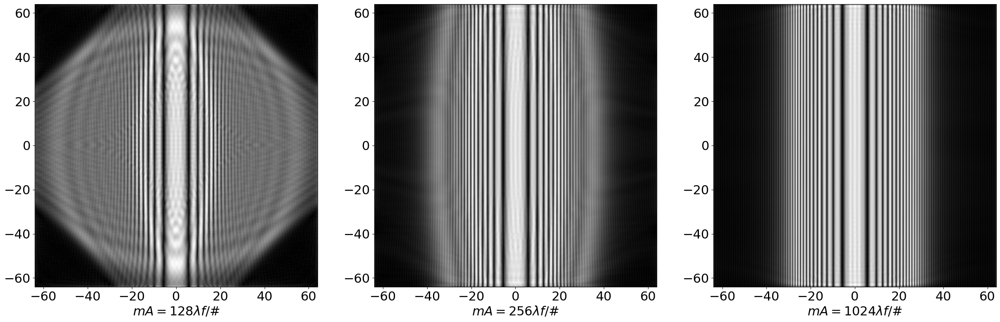

In [5]:
fig, [ax1, ax2, ax3] = plt.subplots(1,3)
plt.rcParams['figure.figsize'] = [20, 10]
u = np.linspace(-2, 2, 1024)
U, V= np.meshgrid(u,u)
side = np.linspace(-64, 64, 512)
X, Y = np.meshgrid(side, side)
alpha=1./128.
Z = np.cos(2*np.pi*alpha*X**2)
mA=128
zz=np.zeros((1024,1024)).astype('complex128')
zz[256:768,256:768]=Z*np.exp(1j*np.pi*(X**2+Y**2)/mA)
zzft=np.fft.fftshift(np.fft.fft2(zz))
zzftFiltered=zzft*pupil(np.sqrt(U**2+V**2))
zzFiltered=np.abs(np.fft.ifft2(np.fft.ifftshift(zzftFiltered)))[256:768,256:768]
ax1.imshow(zzFiltered, cmap='gray', extent=[-64,64,-64,64], aspect='equal')
ax1.set_xlabel(r'$mA=128\lambda f/\#$')
# greater magnification
mA=256
zz=np.zeros((1024,1024)).astype('complex128')
zz[256:768,256:768]=Z*np.exp(1j*np.pi*(X**2+Y**2)/mA)
zzft=np.fft.fftshift(np.fft.fft2(zz))
zzftFiltered=zzft*pupil(np.sqrt(U**2+V**2))
zzFiltered=np.abs(np.fft.ifft2(np.fft.ifftshift(zzftFiltered)))[256:768,256:768]
ax2.imshow(zzFiltered, cmap='gray', extent=[-64,64,-64,64], aspect='equal')
ax2.set_xlabel(r'$mA=256\lambda f/\#$')
# greater magnification
mA=1024
zz=np.zeros((1024,1024)).astype('complex128')
zz[256:768,256:768]=Z*np.exp(1j*np.pi*(X**2+Y**2)/mA)
zzft=np.fft.fftshift(np.fft.fft2(zz))
zzftFiltered=zzft*pupil(np.sqrt(U**2+V**2))
zzFiltered=np.abs(np.fft.ifft2(np.fft.ifftshift(zzftFiltered)))[256:768,256:768]
ax3.imshow(zzFiltered, cmap='gray', extent=[-64,64,-64,64], aspect='equal')
ax3.set_xlabel(r'$mA=1024\lambda f/\#$')


In [6]:
!wget --no-check-certificate --content-disposition https://raw.githubusercontent.com/JudsonLima/computationalImaging/master/images/Sawn.jpg


--2023-11-22 02:18:44--  https://raw.githubusercontent.com/JudsonLima/computationalImaging/master/images/Sawn.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8883430 (8.5M) [application/octet-stream]
Saving to: ‘Sawn.jpg’

Sawn.jpg            100%[===================>]   8.47M  26.8MB/s    in 0.3s    

2023-11-22 02:18:47 (26.8 MB/s) - ‘Sawn.jpg’ saved [8883430/8883430]



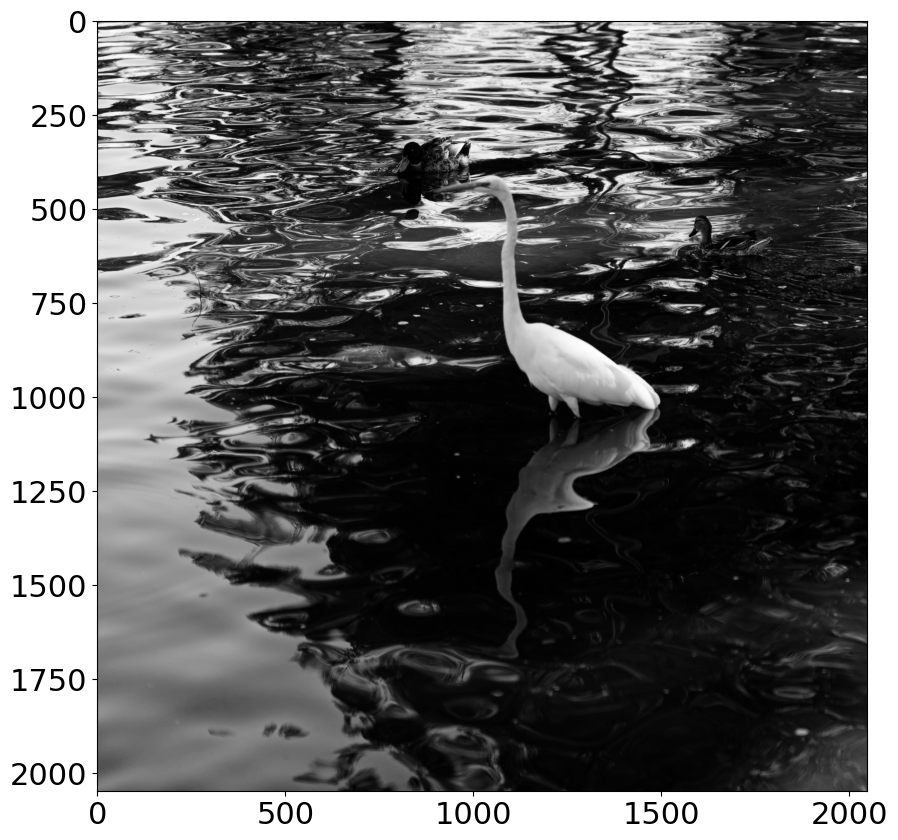

In [90]:
pop=io.imread('Sawn.jpg',as_gray=True)
pop=pop[2500:7000,2000:6500]
pop=cv2.resize(pop,(2048,2048))
pop=pop-np.mean(pop)

plt.imshow(pop, cmap='gray')

Text(0.5, 0, '$mA=512\\lambda f/\\#$')

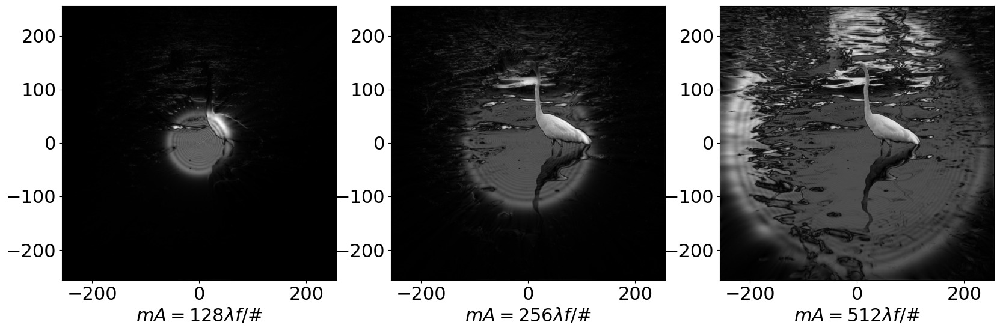

In [91]:
fig, [ax1, ax2, ax3] = plt.subplots(1,3)
plt.rcParams['figure.figsize'] = [20, 10]
u = np.linspace(-2, 2, 4096)
U, V= np.meshgrid(u,u)
side = np.linspace(-256, 256, 2048)
X, Y = np.meshgrid(side, side)
Z = pop
mA=128
zz=np.zeros((4096,4096)).astype('complex128')
zz[1024:3072,1024:3072]=Z*np.exp(1j*np.pi*(X**2+Y**2)/mA)
zzft=np.fft.fftshift(np.fft.fft2(zz))
zzftFiltered=zzft*pupil(np.sqrt(U**2+V**2))
zzFiltered=np.abs(np.fft.ifft2(np.fft.ifftshift(zzftFiltered)))[1024:3072,1024:3072]
ax1.imshow(zzFiltered, cmap='gray', extent=[-256,256,-256,256], aspect='equal')
ax1.set_xlabel(r'$mA=128\lambda f/\#$')
mA=256
np.zeros((4096,4096)).astype('complex128')
zz[1024:3072,1024:3072]=Z*np.exp(1j*np.pi*(X**2+Y**2)/mA)
zzft=np.fft.fftshift(np.fft.fft2(zz))
zzftFiltered=zzft*pupil(np.sqrt(U**2+V**2))
zzFiltered=np.abs(np.fft.ifft2(np.fft.ifftshift(zzftFiltered)))[1024:3072,1024:3072]
ax2.imshow(zzFiltered, cmap='gray', extent=[-256,256,-256,256], aspect='equal')
ax2.set_xlabel(r'$mA=256\lambda f/\#$')
mA=512
np.zeros((4096,4096)).astype('complex128')
zz[1024:3072,1024:3072]=Z*np.exp(1j*np.pi*(X**2+Y**2)/mA)
zzft=np.fft.fftshift(np.fft.fft2(zz))
zzftFiltered=zzft*pupil(np.sqrt(U**2+V**2))
zzFiltered=np.abs(np.fft.ifft2(np.fft.ifftshift(zzftFiltered)))[1024:3072,1024:3072]
ax3.imshow(zzFiltered, cmap='gray', extent=[-256,256,-256,256], aspect='equal')
ax3.set_xlabel(r'$mA=512\lambda f/\#$')

Shown is a real-valued photograph, but the mean pixel value is set to zero suppress the otherwise dominant zero frequency component. Since the image is still dominated by low frequencies, the image field is limited. However, high frequency components along sharp frequency components of the image extend the observed image region. While features are observed beyond the limitations of the con- stant field, the high frequency features at the edge of the scene are aliased into the low frequency passband.

## diffuse natural image

Text(0.5, 0, '$mA=1024\\lambda f/\\#$')

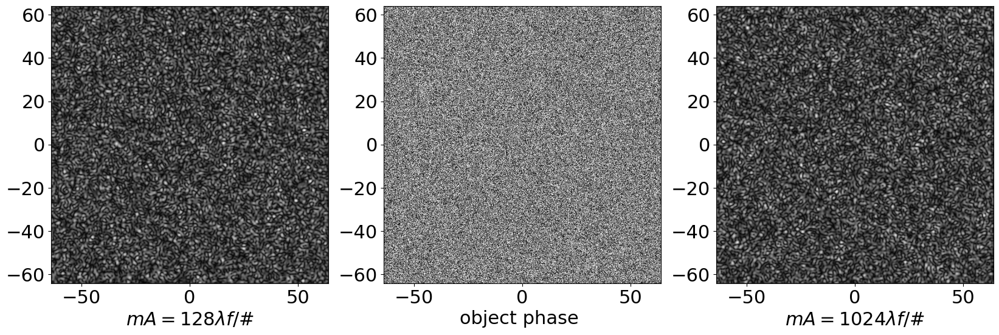

In [92]:
fig, [ax1, ax2, ax3] = plt.subplots(1,3)
plt.rcParams['figure.figsize'] = [20, 10]
u = np.linspace(-2, 2, 1024)
U, V= np.meshgrid(u,u)
side = np.linspace(-64, 64, 512)
X, Y = np.meshgrid(side, side)
alpha=1./128.
Z = np.exp(2*1j*np.pi*np.random.random(size=(512,512)))
mA=64
zz=np.zeros((1024,1024)).astype('complex128')
zz[256:768,256:768]=Z*np.exp(1j*np.pi*(X**2+Y**2)/mA)
zzft=np.fft.fftshift(np.fft.fft2(zz))
zzftFiltered=zzft*pupil(np.sqrt(U**2+V**2))
zzFiltered=np.abs(np.fft.ifft2(np.fft.ifftshift(zzftFiltered)))[256:768,256:768]
ax1.imshow(zzFiltered, cmap='gray', extent=[-64,64,-64,64], aspect='equal')
ax1.set_xlabel(r'$mA=128\lambda f/\#$')
# true image
mA=256
ax2.imshow(np.angle(Z), cmap='gray', extent=[-64,64,-64,64], aspect='equal')
ax2.set_xlabel(r'object phase ')
# greater magnification
mA=1024
zz=np.zeros((1024,1024)).astype('complex128')
zz[256:768,256:768]=Z*np.exp(1j*np.pi*(X**2+Y**2)/mA)
zzft=np.fft.fftshift(np.fft.fft2(zz))
zzftFiltered=zzft*pupil(np.sqrt(U**2+V**2))
zzFiltered=np.abs(np.fft.ifft2(np.fft.ifftshift(zzftFiltered)))[256:768,256:768]
ax3.imshow(zzFiltered, cmap='gray', extent=[-64,64,-64,64], aspect='equal')
ax3.set_xlabel(r'$mA=1024\lambda f/\#$')


The amplitude of each pixel is 1, but the phase is uniformly
distributed between 0 and 2π. The distribution of image data across the two scenes is similar. Both left and right images are speckled images of the true object.

## diffuse reflection of object

Text(0.5, 0, '$mA=512\\lambda f/\\#$')

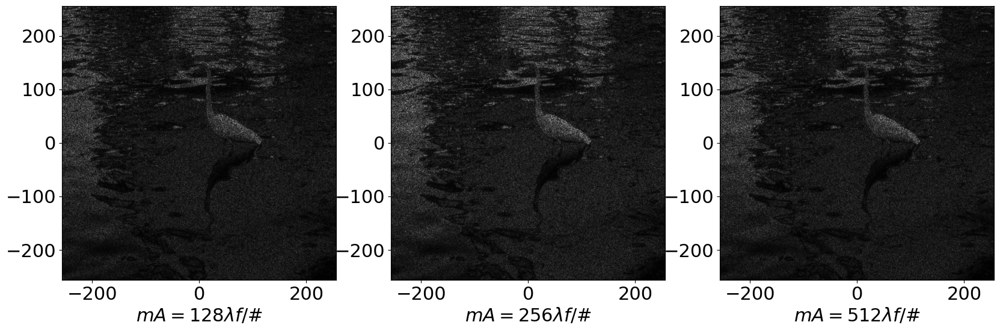

In [93]:
fig, [ax1, ax2, ax3] = plt.subplots(1,3)
plt.rcParams['figure.figsize'] = [20, 10]
u = np.linspace(-2, 2, 4096)
U, V= np.meshgrid(u,u)
side = np.linspace(-256, 256, 2048)
X, Y = np.meshgrid(side, side)
Z = pop*np.exp(2*1j*np.pi*np.random.random(size=(2048,2048)))
mA=128
zz=np.zeros((4096,4096)).astype('complex128')
zz[1024:3072,1024:3072]=Z*np.exp(1j*np.pi*(X**2+Y**2)/mA)
zzft=np.fft.fftshift(np.fft.fft2(zz))
zzftFiltered=zzft*pupil(np.sqrt(U**2+V**2))
zzFiltered=np.abs(np.fft.ifft2(np.fft.ifftshift(zzftFiltered)))[1024:3072,1024:3072]
ax1.imshow(zzFiltered, cmap='gray', extent=[-256,256,-256,256], aspect='equal')
ax1.set_xlabel(r'$mA=128\lambda f/\#$')
mA=256
np.zeros((4096,4096)).astype('complex128')
zz[1024:3072,1024:3072]=Z*np.exp(1j*np.pi*(X**2+Y**2)/mA)
zzft=np.fft.fftshift(np.fft.fft2(zz))
zzftFiltered=zzft*pupil(np.sqrt(U**2+V**2))
zzFiltered=np.abs(np.fft.ifft2(np.fft.ifftshift(zzftFiltered)))[1024:3072,1024:3072]
ax2.imshow(zzFiltered, cmap='gray', extent=[-256,256,-256,256], aspect='equal')
ax2.set_xlabel(r'$mA=256\lambda f/\#$')
mA=512
np.zeros((4096,4096)).astype('complex128')
zz[1024:3072,1024:3072]=Z*np.exp(1j*np.pi*(X**2+Y**2)/mA)
zzft=np.fft.fftshift(np.fft.fft2(zz))
zzftFiltered=zzft*pupil(np.sqrt(U**2+V**2))
zzFiltered=np.abs(np.fft.ifft2(np.fft.ifftshift(zzftFiltered)))[1024:3072,1024:3072]
ax3.imshow(zzFiltered, cmap='gray', extent=[-256,256,-256,256], aspect='equal')
ax3.set_xlabel(r'$mA=512\lambda f/\#$')

## Results

Surface that are rough on the wavelength scale, in contrast, generate diffuse reflection. Such surfaces contain many subsurfaces that point in random directions.

With a random phase, one does not observe a cut off in the observed image at |x| = |M|A because all regions in the object field radiate into the shifting passband of the imager. The phase pattern is blurred in both images due to the local bandpass of the imaging system. The size of the each speckle is on the scale of the width of the impulse response, ≈ 5λf/#. Here the phase of each pixel is random.

## Image transformations defocus

Text(0.5, 1.0, 'ten waves')

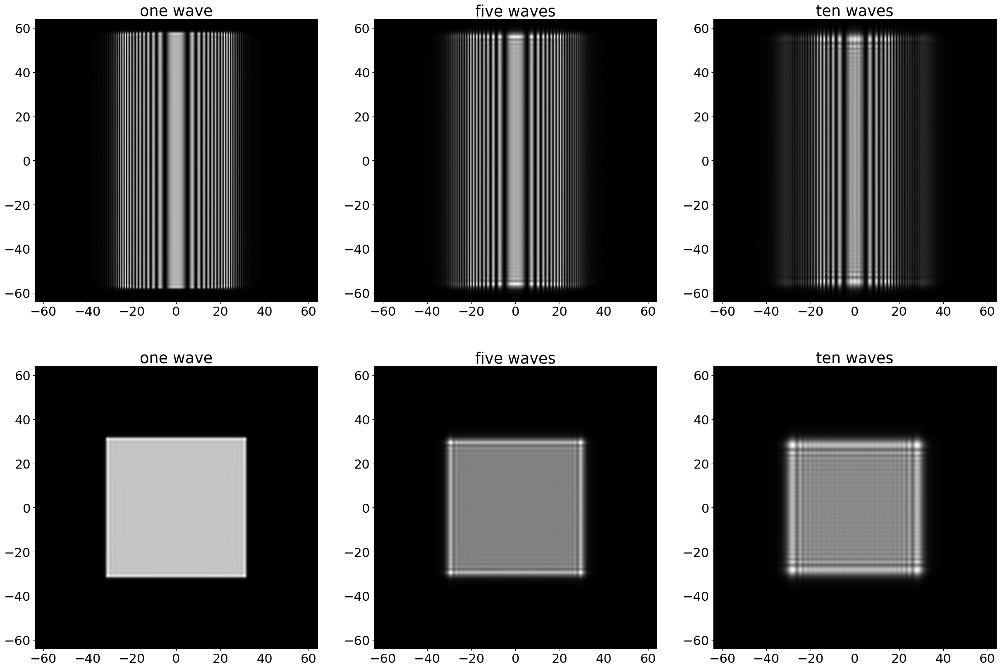

In [45]:
plt.rcParams['figure.figsize'] = [30, 20]
X=64
N=1024
side = np.linspace(-X, X, N)
dx=side[2]-side[1]
u = np.arange(-np.int16(N),np.int16(N))/(2*N*dx)
x, y = np.meshgrid(side, side)
U, V= np.meshgrid(u,u)
alpha=1./128.
Z = np.cos(2*np.pi*alpha*x**2)
fig, [[ax1, ax2, ax3], [ax4, ax5, ax6]] = plt.subplots(2,3)
# one wave defocus
w20=1
zz=np.zeros((2*N,2*N))
zz[np.int16(N/2):np.int16(3*N/2),np.int16(N/2):np.int16(3*N/2)]=Z
zzft=np.fft.fftshift(np.fft.fft2(zz))
zzftFiltered=zzft*pupil(np.sqrt(U**2+V**2))*np.exp(2*np.pi*1j*w20*(U**2+V**2))
zzFiltered=np.abs(np.fft.ifft2(np.fft.ifftshift(zzftFiltered)))[np.int16(N/2-50):np.int16(3*N/2+50),np.int16(N/2-50):np.int16(3*N/2+50)]**2
ax1.imshow(zzFiltered, cmap='gray', extent=[-64,64,-64,64], aspect='equal')
ax1.set_title('one wave')
# 2 wave defocus
w20=5
zz=np.zeros((2*N,2*N))
zz[np.int16(N/2):np.int16(3*N/2),np.int16(N/2):np.int16(3*N/2)]=Z
zzft=np.fft.fftshift(np.fft.fft2(zz))
zzftFiltered=zzft*pupil(np.sqrt(U**2+V**2))*np.exp(2*np.pi*1j*w20*(U**2+V**2))
zzFiltered=np.abs(np.fft.ifft2(np.fft.ifftshift(zzftFiltered)))[np.int16(N/2-50):np.int16(3*N/2+50),np.int16(N/2-50):np.int16(3*N/2+50)]**2
ax2.imshow(zzFiltered, cmap='gray', extent=[-64,64,-64,64], aspect='equal')
ax2.set_title('five waves')
# 10 wave defocus
w20=10
zz=np.zeros((2*N,2*N))
zz[np.int16(N/2):np.int16(3*N/2),np.int16(N/2):np.int16(3*N/2)]=Z
zzft=np.fft.fftshift(np.fft.fft2(zz))
zzftFiltered=zzft*pupil(np.sqrt(U**2+V**2))*np.exp(2*np.pi*1j*w20*(U**2+V**2))
zzFiltered=np.abs(np.fft.ifft2(np.fft.ifftshift(zzftFiltered)))[np.int16(N/2-50):np.int16(3*N/2+50),np.int16(N/2-50):np.int16(3*N/2+50)]**2
ax3.imshow(zzFiltered, cmap='gray', extent=[-64,64,-64,64], aspect='equal')
ax3.set_title('ten waves')
# different object
Z=np.zeros((N,N))
Z[np.int16(N/4):np.int16(3*N/4),np.int16(N/4):np.int16(3*N/4)]=1
# one wave defocus
w20=1
zz=np.zeros((2*N,2*N))
zz[np.int16(N/2):np.int16(3*N/2),np.int16(N/2):np.int16(3*N/2)]=Z
zzft=np.fft.fftshift(np.fft.fft2(zz))
zzftFiltered=zzft*pupil(np.sqrt(U**2+V**2))*np.exp(2*np.pi*1j*w20*(U**2+V**2))
zzFiltered=np.abs(np.fft.ifft2(np.fft.ifftshift(zzftFiltered)))[np.int16(N/2):np.int16(3*N/2),np.int16(N/2):np.int16(3*N/2)]**2
ax4.imshow(zzFiltered, cmap='gray', extent=[-64,64,-64,64], aspect='equal')
ax4.set_title('one wave')
# 2 wave defocus
w20=5
zz=np.zeros((2*N,2*N))
zz[np.int16(N/2):np.int16(3*N/2),np.int16(N/2):np.int16(3*N/2)]=Z
zzft=np.fft.fftshift(np.fft.fft2(zz))
zzftFiltered=zzft*pupil(np.sqrt(U**2+V**2))*np.exp(2*np.pi*1j*w20*(U**2+V**2))
zzFiltered=np.abs(np.fft.ifft2(np.fft.ifftshift(zzftFiltered)))[np.int16(N/2):np.int16(3*N/2),np.int16(N/2):np.int16(3*N/2)]**2
ax5.imshow(zzFiltered, cmap='gray', extent=[-64,64,-64,64], aspect='equal')
ax5.set_title('five waves')
# 10 wave defocus
w20=10
zz=np.zeros((2*N,2*N))
zz[np.int16(N/2):np.int16(3*N/2),np.int16(N/2):np.int16(3*N/2)]=Z
zzft=np.fft.fftshift(np.fft.fft2(zz))
zzftFiltered=zzft*pupil(np.sqrt(U**2+V**2))*np.exp(2*np.pi*1j*w20*(U**2+V**2))
zzFiltered=np.abs(np.fft.ifft2(np.fft.ifftshift(zzftFiltered)))[np.int16(N/2):np.int16(3*N/2),np.int16(N/2):np.int16(3*N/2)]**2
ax6.imshow(zzFiltered, cmap='gray', extent=[-64,64,-64,64], aspect='equal')
ax6.set_title('ten waves')



The side lobes for the defocused image arise in part from the fact that the spatial extent of the PSF increases with defocus, but wavelength-scale variation in the phase and amplitude of the PSF persist as the defocus increases.

## Diffuse object due to defocus

In [46]:
pop=io.imread('Sawn.jpg',as_gray=True)
pop=pop[2500:7000,2000:6500]
pop=cv2.resize(pop,(512,512))
pop=pop-np.mean(pop)

Text(0.5, 1.0, '10 waves defocus')

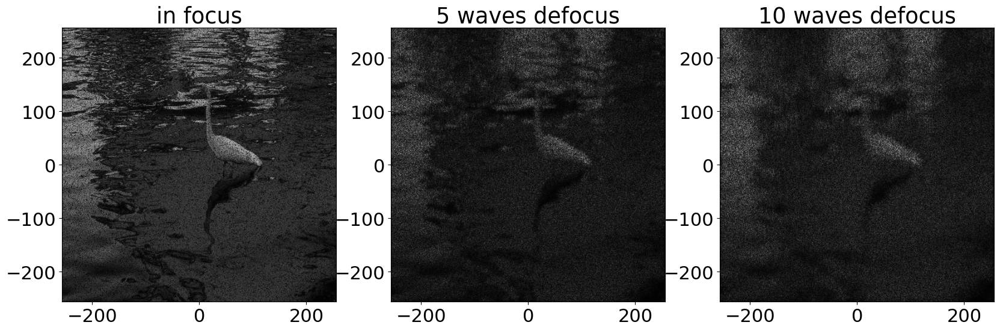

In [49]:
fig, [ax1, ax2, ax3] = plt.subplots(1,3)
plt.rcParams['figure.figsize'] = [20, 10]
X=256
N=512
side = np.linspace(-X, X, N)
dx=side[2]-side[1]
u = np.arange(-np.int16(N),np.int16(N))/(2*N*dx)
x, y = np.meshgrid(side, side)
U, V= np.meshgrid(u,u)
Z = pop*np.exp(2*1j*np.pi*np.random.random(size=(N,N)))
# in focus wave
w20=0
zz=np.zeros((1024,1024)).astype('complex128')
zz[256:768,256:768]=Z
zzft=np.fft.fftshift(np.fft.fft2(zz))
zzftFiltered=zzft*pupil(np.sqrt(U**2+V**2))*np.exp(2*np.pi*1j*w20*(U**2+V**2))
zzFiltered=np.abs(np.fft.ifft2(np.fft.ifftshift(zzftFiltered)))[256:768,256:768]
ax1.imshow(zzFiltered, cmap='gray', extent=[-X,X,-X,X], aspect='equal')
ax1.set_title('in focus')
# 5 waves
w20=5
zzftFiltered=zzft*pupil(np.sqrt(U**2+V**2))*np.exp(2*np.pi*1j*w20*(U**2+V**2))
zzFiltered=np.abs(np.fft.ifft2(np.fft.ifftshift(zzftFiltered)))[256:768,256:768]
ax2.imshow(zzFiltered, cmap='gray', extent=[-X,X,-X,X], aspect='equal')
ax2.set_title('5 waves defocus')
# ten waves
w20=10
zzftFiltered=zzft*pupil(np.sqrt(U**2+V**2))*np.exp(2*np.pi*1j*w20*(U**2+V**2))
zzFiltered=np.abs(np.fft.ifft2(np.fft.ifftshift(zzftFiltered)))[256:768,256:768]
ax3.imshow(zzFiltered, cmap='gray', extent=[-X,X,-X,X], aspect='equal')
ax3.set_title('10 waves defocus')

## Results

Defocus changes the phase of the transfer function, but does not in any way shift the spatial frequency passband. Here the characteristic size and distribution of speckle changes with defocus.

While defocus does not increase the spatial bandpass of an imaging sys- tem, images taken in diverse focal states do represent partially independent measurements of the diffracting irradiance.

# Ptychographic Imaging

Test image

In [51]:
!wget --no-check-certificate --content-disposition https://raw.githubusercontent.com/JudsonLima/computationalImaging/master/images/Skeleton.jpg


--2023-11-22 03:14:12--  https://raw.githubusercontent.com/JudsonLima/computationalImaging/master/images/Skeleton.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.110.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1497791 (1.4M) [image/jpeg]
Saving to: ‘Skeleton.jpg’

Skeleton.jpg        100%[===================>]   1.43M  6.63MB/s    in 0.2s    

2023-11-22 03:14:13 (6.63 MB/s) - ‘Skeleton.jpg’ saved [1497791/1497791]



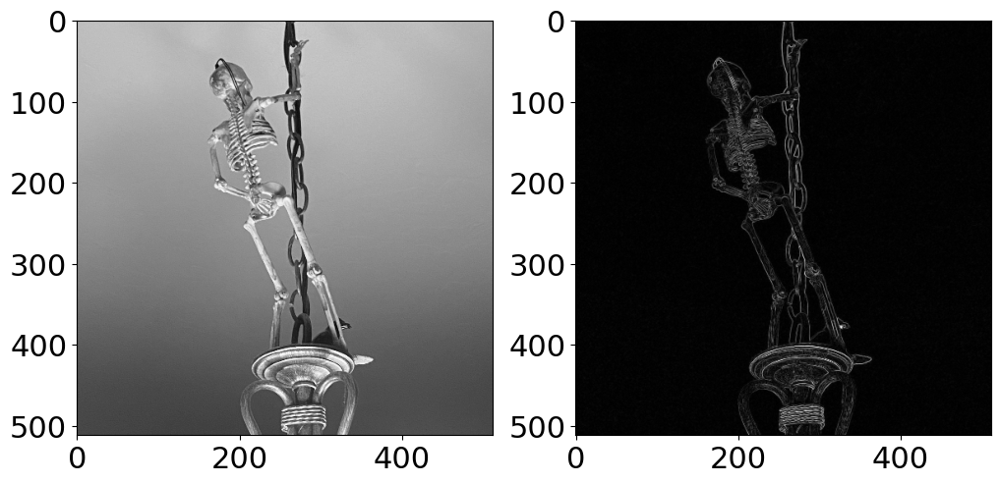

In [56]:
im = cv2.imread('Skeleton.jpg',0)/255
im=im[500:2500,500:2500]
im=cv2.resize(im,(512,512))

im=im-np.mean(im)
plt.figure(figsize= (12,6))

imf=filters.roberts(im)
plt.subplot(1,2,1)
plt.imshow(im,cmap = 'gray')
plt.subplot(1,2,2)
plt.imshow(imf,cmap = 'gray')

Considering use of a high pass filtered version to focus more on high frequencies. Made the image zero mean to reduce the low frequency signal.

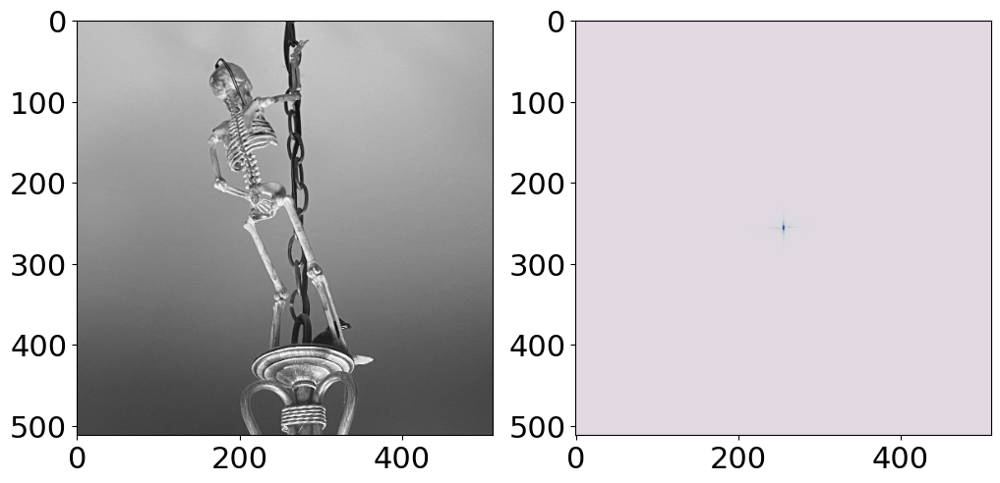

In [57]:
im = cv2.imread('Skeleton.jpg',0)/255
im=im[500:2500,500:2500]
im=cv2.resize(im,(512,512))

im=im-np.mean(im)
plt.figure(figsize= (12,6))
imfT=np.fft.fftshift(np.fft.fft2(im))
plt.subplot(1,2,1)
plt.imshow(im,cmap = 'gray')
plt.subplot(1,2,2)
plt.imshow(np.abs(imfT),cmap = 'twilight')


To illustrate the sampling in real space ptychography. The forward model is
$$
\begin{array}{rl}
     g(u',v',x',y')&=|{\cal F}\lbrace f(x,y)P(x-x',y-y')\rbrace |^2 \\
     & =|\int\int e^{2\pi i (ux'+vy')}{\hat f}(u,v){\hat P}(u'-u,v'-v)dudv |^2
\end{array}
$$

## Ptychographic Sampling

In [58]:
## PUPIL
def get_pupil(apD):
    # apD: diameter of the aperture
    # returns an array apD by apD array enclosing an circular aperture of radius apD/a
    r = apD/2
    y,x = np.ogrid[-r+0.5: r:1, -r+0.5: r]
    disk = x**2+y**2 <= r**2
    disk = disk.astype(float)
    return disk

Using a circular sampling of size 128 on a 512 pixel image to look at the sample structure in Fourier space.

In [59]:
def pyMeasurement(x,y, im):
  # multiply a N by N image by a 128 diameter aperture centered at x,y, return the fourier transformation
  mask=np.zeros(im.shape)
  mask[(x-64):(x+64),(y-64):(y+64)]=get_pupil(128)
  gx=mask*im
  gu=np.abs(np.fft.fftshift(np.fft.fft2(gx)))**2
  return gx, gu

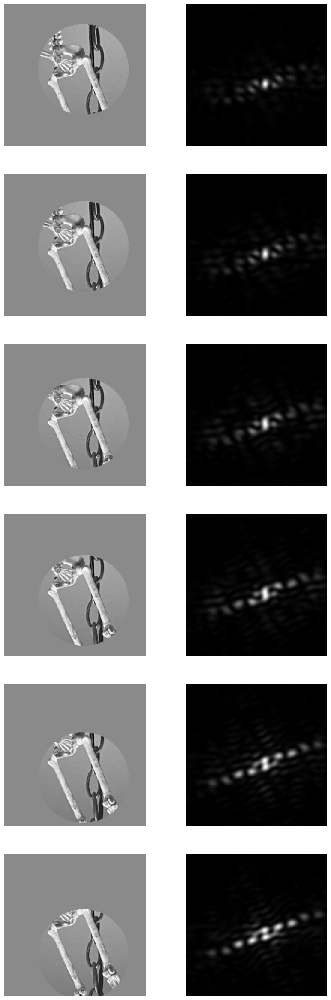

In [68]:
imP=np.pad(im,256)
plt.figure(figsize= (10,30))
for pip in range(6):
  a,b= pyMeasurement(pip*10+512-20,512,imP)
  plt.subplot(6,2,2*pip+1)
  plt.imshow(a[400:600,400:600], cmap='gray')
  plt.axis('off')
  plt.subplot(6,2,2*pip+2)
  plt.imshow(b[400:600,400:600], cmap='gray')
  plt.axis('off')

With Fourier ptychography, apply the aperture in fourier space and then consider the real space spectrogram. The forward model in this case is \begin{equation}
\begin{array}{rl}
     g(x',y',u',v')&=|{\cal F}^{-1}\lbrace {\hat f}(u,v)P(u-u',v-v')\rbrace |^2 \\
     & =|\int\int e^{2\pi i (u'x+v'y)}f(x,y)h(x'-x,y'-y)dxdy |^2
\end{array}
\end{equation}
here is an example set of measurements in this case:


In [69]:
def pyMeasurement(x,y, im):
  # multiply a N by N image by a 128 diameter aperture centered at x,y, return the fourier transformation
  mask=np.zeros(im.shape)
  mask[(x-64):(x+64),(y-64):(y+64)]=get_pupil(128)
  gx=mask*im
  gu=np.abs(np.fft.ifft2(np.fft.fftshift(gx)))**2
  return gx, gu

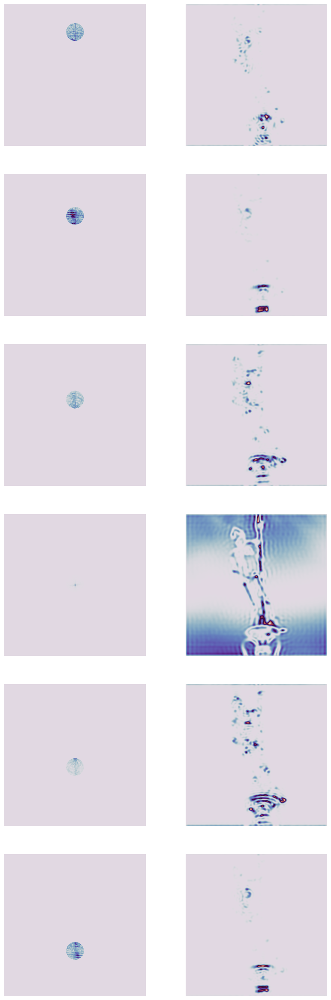

In [70]:
plt.figure(figsize= (10,30))
imFT=np.fft.fftshift(np.fft.fft2(imP))
for pip in range(6):
  a,b= pyMeasurement(pip*100+200,512,imFT)
  plt.subplot(6,2,2*pip+1)
  plt.imshow(np.abs(a), cmap='twilight')
  plt.axis('off')
  plt.subplot(6,2,2*pip+2)
  plt.imshow(b[256:768,256:768], cmap='twilight')
  plt.axis('off')

## Fourier Ptychography

In [71]:
input_dim = 512     # image dimension (512,512)
pad = 8 + 25       # Adding padding to the fourier space
measure_dim = 128     # diameter of the aperture
spacing = int(np.round(128 * (1-0.61)))   # spacing between apertures, ensure 61% overlap

Fourier ptychography measures the spectrogram of an image with a shifting low pass filter. Here each circle represents an aperture location in Fourier Space. Meanwhile, The square represents the Fourier transform of the image.

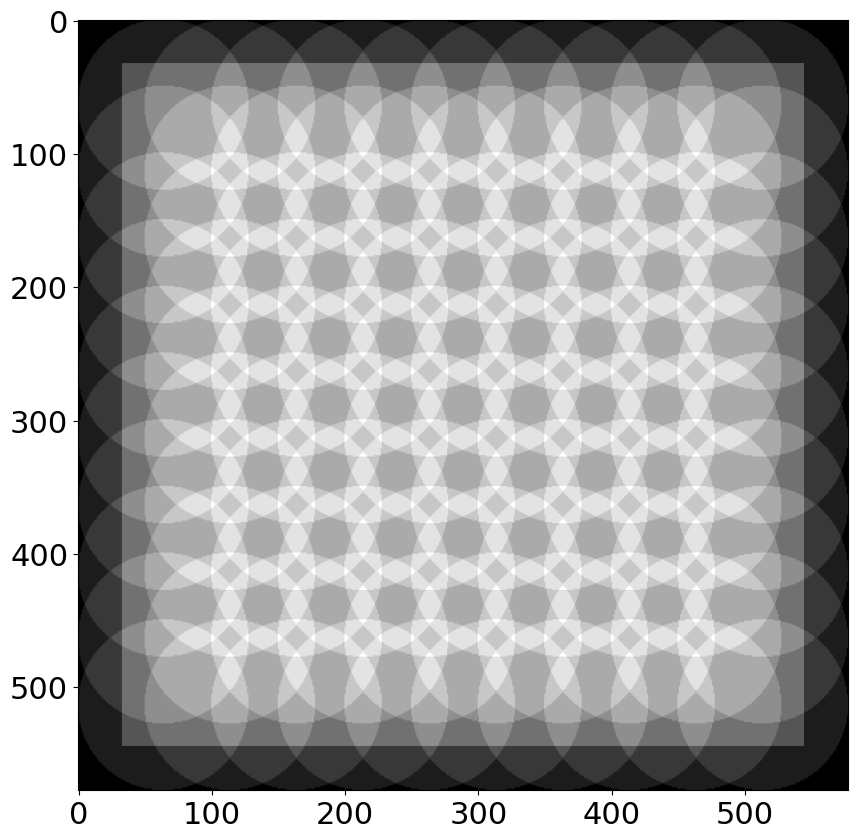

In [72]:
mesh = np.arange(0,input_dim + 2  * pad - measure_dim + 1,spacing)
xlocations,ylocations = np.meshgrid(mesh,mesh);
xlocations = xlocations.astype(int).flatten()
ylocations = ylocations.astype(int).flatten()
num_frame = len(mesh)**2

dim_measure = np.ones([num_frame],'int') * measure_dim
cam_locations = np.concatenate([xlocations.reshape([-1,1]),ylocations.reshape([-1,1])],1)

## pattern
pattern = np.zeros([input_dim + 2  * pad,input_dim + 2  * pad])
pattern[pad:input_dim + pad,pad:input_dim + pad] = 2
for i in range(len(dim_measure)):
    pattern[cam_locations[i,0]:cam_locations[i,0]+dim_measure[i],
            cam_locations[i,1]:cam_locations[i,1]+dim_measure[i]] += get_pupil(dim_measure[i])
plt.figure(figsize = (10,10))
plt.imshow(pattern,cmap='gray')
plt.show()

In [73]:
pattern = np.zeros([input_dim + 2  * pad,input_dim + 2  * pad])
for i in range(len(dim_measure)):
    pattern[cam_locations[i,0]:cam_locations[i,0]+dim_measure[i],
            cam_locations[i,1]:cam_locations[i,1]+dim_measure[i]] += get_pupil(dim_measure[i])
pattern = np.maximum(1,pattern) ## ensure not divided by 0

## Fourier Ptychography Measurement

As illustrated above, the number of measurements is determined by the number of low pass windows needed to span the full Fourier space. Here it is assumed that apertures are translated by 1/2 aperture in each direction, in all about 4 measurements are made of every point in the fourier space.

In [74]:
def get_measurement(im,photons,is_noisy,is_energy_constraint):
    X = np.zeros([num_frame,measure_dim,measure_dim])
    x = np.pad(np.fft.fftshift(np.fft.fft2(im.astype('complex128')))/input_dim,((pad,pad),(pad,pad)))
    if is_energy_constraint == True:
        x = x / np.sqrt(pattern)
    for i in range(num_frame):
        X[i,:,:] = np.abs(np.fft.ifft2(x[cam_locations[i,0]:cam_locations[i,0]+dim_measure[i],
                                        cam_locations[i,1]:cam_locations[i,1]+dim_measure[i]]* get_pupil(dim_measure[i]))) *np.sqrt(photons) * dim_measure[i]
    if is_noisy:
        X = np.sqrt(np.random.poisson(np.power(X,2)))
    return X/np.sqrt(photons)

Apply the Gerchberg Saxton error reduction technique iteratively for each subapeture to retrieve the image. The measurements are randomly shuffled to update a periodically. The iterative algorithm updates according to all the captured frames 100 times.

In [75]:
def reconstruction(measure,is_energy_constraint):
    ## AP
    initial_image = cv2.resize(measure[45,:,:],(512,512))
    xest = np.pad(np.fft.fftshift(np.fft.fft2(initial_image.astype('complex128')))/input_dim,((pad,pad),(pad,pad)))
    order = list(range(num_frame))
    for iter_ in range(100):
        xest[0:pad,:] = 0
        xest[pad+512:pad*2 + 512,:] = 0
        xest[:,0:pad] = 0
        xest[:pad+512:pad*2 + 512] = 0
        random.shuffle(order)
        for im_idx in order:
            im = np.fft.ifft2(xest[cam_locations[im_idx,0]:cam_locations[im_idx,0]+dim_measure[im_idx],
                                   cam_locations[im_idx,1]:cam_locations[im_idx,1]+dim_measure[im_idx]]* get_pupil(dim_measure[im_idx]))
            im = measure[im_idx,:,:].astype('complex128') * np.exp(1j * np.angle(im))
            xest[cam_locations[im_idx,0]:cam_locations[im_idx,0]+dim_measure[im_idx],
                 cam_locations[im_idx,1]:cam_locations[im_idx,1]+dim_measure[im_idx]] = xest[cam_locations[im_idx,0]:cam_locations[im_idx,0]+dim_measure[im_idx],
                                                                                             cam_locations[im_idx,1]:cam_locations[im_idx,1]+dim_measure[im_idx]] * (1-get_pupil(dim_measure[im_idx])) + np.fft.fft2(im) / dim_measure[im_idx] * get_pupil(dim_measure[im_idx])
    if is_energy_constraint == True:
        estimate = np.fft.ifft2(np.fft.ifftshift(xest[pad:pad + input_dim,pad:pad + input_dim] * np.sqrt(pattern[pad:pad + input_dim,pad:pad + input_dim]))) * input_dim
    else:
        estimate = np.fft.ifft2(np.fft.ifftshift(xest[pad:pad + input_dim,pad:pad + input_dim])) * input_dim
    return estimate

## Error metrics

If $\underline{f}$ is an $N$-element optical field, and an estimate of this field is $\underline{f}_{\rm est}$.
One way to address this is to optimize the MSE over a global phase:
\begin{equation}
MSE = \underset{\psi}{argmin} \frac{1}{N} \left\| e^{j \psi} \underline{f} - \underline{f}_{\rm est} \right\|^2.
\end{equation}

In [77]:
def mse_loss(xest,y):
    error = abs(xest)**2 + abs(y)**2-2*np.abs(np.conjugate(xest)*y)
    return np.mean(error)

## Reconstruction vs noise per pixel

<ipython-input-82-ec036ad5a6d1>:13: DeprecationWarning: `np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.str_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  plt.title(np.str(10**(pip+1))+' photons; PSNR='+np.str(10*np.log10(1/mse_loss(estimate,im))))


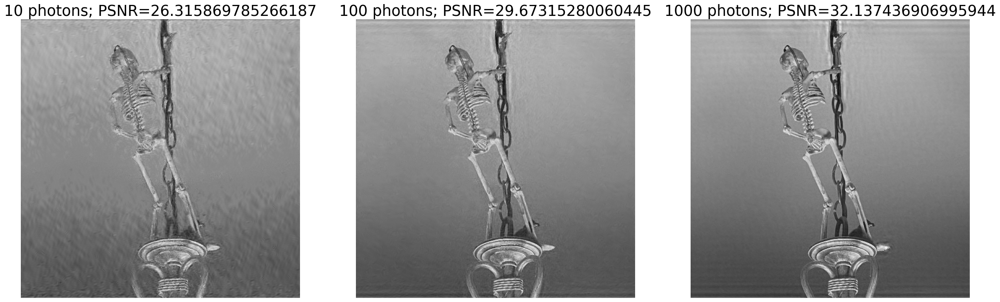

In [82]:
# measurement

plt.figure(figsize= (30,10))
for pip in range(3):
  measurement = get_measurement(im,photons = 10**(pip+1),is_noisy = True ,is_energy_constraint = False)

# reconstruction
  estimate = reconstruction(measurement,is_energy_constraint = False)
  rotation=np.conjugate(estimate)*im/(np.abs(estimate)*np.abs(im))
  plt.subplot(1,3,pip+1)
  plt.imshow(np.real(rotation*estimate),cmap='gray')
  plt.title(np.str(10**(pip+1))+' photons; PSNR='+np.str(10*np.log10(1/mse_loss(estimate,im))))
  plt.axis('off')